
**GNCIPL Internship Week 4 Project**

**Submitted By:** Sahil Adlakha

**Title:** Real Estate Segmentation

**Domain:** Real Estate

**Dataset:** California Housing Dataset (Built-in Dataset)


In [1]:
# Importing libraries
import pandas as pd
import numpy as np
from sklearn.datasets import fetch_california_housing
from sklearn.preprocessing import StandardScaler, KBinsDiscretizer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import folium


In [2]:
# Loading dataset
housing = fetch_california_housing(as_frame=True)
df = housing.frame


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MedInc       20640 non-null  float64
 1   HouseAge     20640 non-null  float64
 2   AveRooms     20640 non-null  float64
 3   AveBedrms    20640 non-null  float64
 4   Population   20640 non-null  float64
 5   AveOccup     20640 non-null  float64
 6   Latitude     20640 non-null  float64
 7   Longitude    20640 non-null  float64
 8   MedHouseVal  20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


In [4]:
df.shape

(20640, 9)

In [5]:
df.isnull().sum()

,0
MedInc,0
HouseAge,0
AveRooms,0
AveBedrms,0
Population,0
AveOccup,0
Latitude,0
Longitude,0
MedHouseVal,0


In [6]:
# Keep only price and location
df = df[['Latitude', 'Longitude', 'MedHouseVal']]
df.columns = ['latitude', 'longitude', 'price']

In [7]:
# Normalize
scaler = StandardScaler()
df[['latitude_scaled', 'longitude_scaled', 'price_scaled']] = scaler.fit_transform(df[['latitude','longitude','price']])


/tmp/ipython-input-4175055624.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[['latitude_scaled', 'longitude_scaled', 'price_scaled']] = scaler.fit_transform(df[['latitude','longitude','price']])
/tmp/ipython-input-4175055624.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[['latitude_scaled', 'longitude_scaled', 'price_scaled']] = scaler.fit_transform(df[['latitude','longitude','price']])
/tmp/ipython-input-4175055624.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

In [8]:
# Binning
discretizer = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')
df['price_bin'] = discretizer.fit_transform(df[['price']]).astype(int)

/tmp/ipython-input-2315006846.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['price_bin'] = discretizer.fit_transform(df[['price']]).astype(int)


In [9]:
# PCA
pca = PCA(n_components=2)
coords = pca.fit_transform(df[['latitude_scaled','longitude_scaled','price_scaled']])


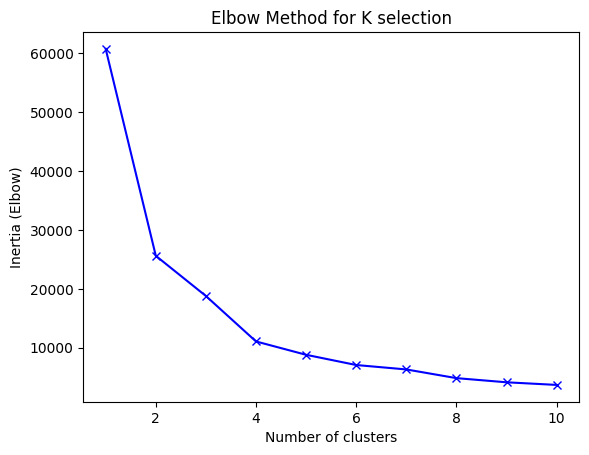

In [10]:
# Elbow Method
inertia = []
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(coords)
    inertia.append(kmeans.inertia_)

plt.plot(K, inertia, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia (Elbow)')
plt.title('Elbow Method for K selection')
plt.show()


In [11]:
# Applying KMeans
kmeans = KMeans(n_clusters=4, random_state=42)
df['cluster'] = kmeans.fit_predict(coords)


/tmp/ipython-input-1097408252.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['cluster'] = kmeans.fit_predict(coords)


In [12]:
df

,latitude,longitude,price,latitude_scaled,longitude_scaled,price_scaled,price_bin,cluster
0,37.88,-122.23,4.526,1.052548,-1.327835,2.129631,4,2
1,37.86,-122.22,3.585,1.043185,-1.322844,1.314156,4,2
2,37.85,-122.24,3.521,1.038503,-1.332827,1.258693,4,2
3,37.85,-122.25,3.413,1.038503,-1.337818,1.165100,4,2
4,37.85,-122.25,3.422,1.038503,-1.337818,1.172900,4,2
...,...,...,...,...,...,...,...,...
20635,39.48,-121.09,0.781,1.801647,-0.758826,-1.115804,0,1
20636,39.49,-121.21,0.771,1.806329,-0.818722,-1.124470,0,1
20637,39.43,-121.22,0.923,1.778237,-0.823713,-0.992746,0,1
20638,39.43,-121.32,0.847,1.778237,-0.873626,-1.058608,0,1


In [13]:
# Final Output
m = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=6)

colors = ['red', 'blue', 'green', 'purple', 'orange']

for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=2,
        color=colors[int(row['cluster'])],
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

m


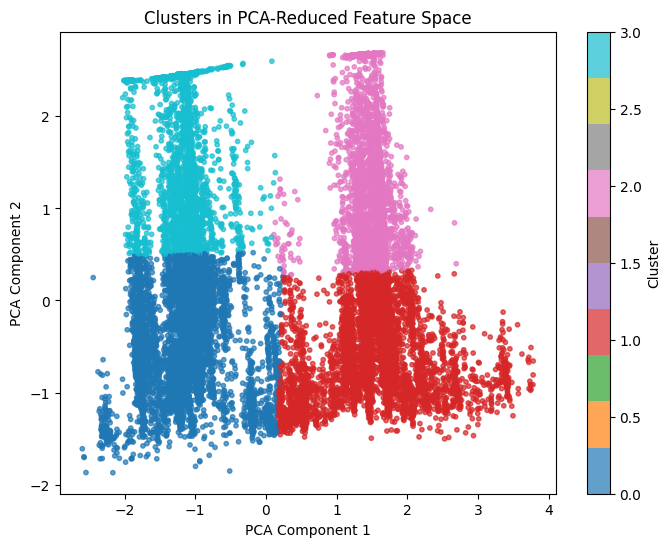

In [14]:

plt.figure(figsize=(8,6))
plt.scatter(
    coords[:,0], coords[:,1],
    c=df['cluster'], cmap='tab10', s=10, alpha=0.7
)

plt.title("Clusters in PCA-Reduced Feature Space")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar(label="Cluster")
plt.show()
